Import Libraries

In [25]:
import math
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import itertools
import scipy.stats as stats
import matplotlib.pyplot as plt
plt.style.use ('ggplot')
import sklearn.metrics as metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import pickle

# Models
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
from catboost import CatBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
import optuna

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

Import Data

In [15]:
# Loading the dataset
data = pd.read_csv(r'C:\Users\Temitope\Concrete_Data_TUD_Sample.csv')
data.head()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


Data and Statistical Analysis

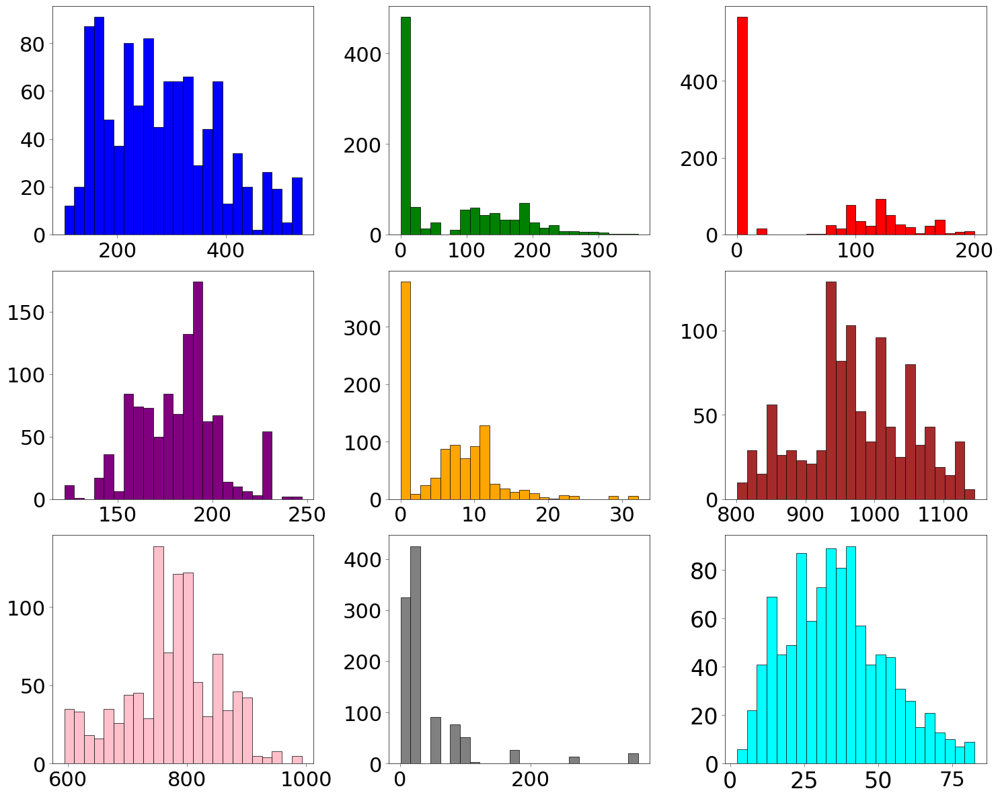

In [19]:
# Histogram Plots
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan']
# Create a 3x3 grid of subplots with square aspect ratio
fig, axes = plt.subplots(3, 3, figsize=(15, 12), squeeze=False)
fig.patch.set_facecolor('white')

# Looping over each column
for i, col in enumerate(data.columns):
    ax = axes[i // 3, i % 3]
    
    # Plot the histogram
    ax.hist(data[col], bins=24, edgecolor='black', color=colors[i % len(colors)])
      
    # Set background color to white
    ax.set_facecolor('white')
    
    # Add a thin external outline with black color
    for spine in ax.spines.values():
        spine.set_color('black')
        spine.set_linewidth(0.5)
    
    # Set major tick marks to be outside
    ax.tick_params(axis='both', direction='out', width=0.5, labelsize=22)
    
    # Show tick marks for the axis lines
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    
    # Set font size for axis tick labels
    plt.xticks(fontsize=24, color="k")
    plt.yticks(fontsize=24, color="k")

  
plt.setp([ax.get_xticklabels() + ax.get_yticklabels() for ax in axes.flatten()], color="k")

plt.tight_layout()
plt.show()

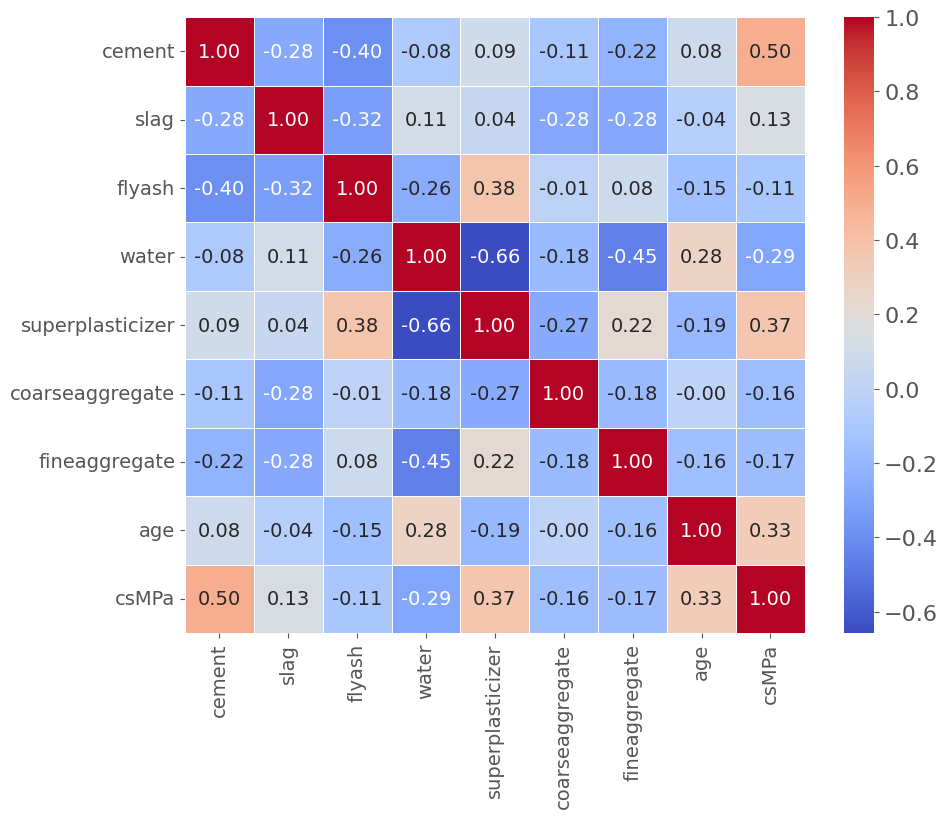

In [21]:
# Correlation Matrix Heatmap
# Load DataFrame
# Calculate the correlation matrix
df_matrix = data.copy()
corr_matrix = df_matrix.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Draw the heatmap
heatmap = sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5, annot_kws={"size": 14})

# Set the font size for x and y labels
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=14)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=14)

# Customize colorbar
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)  

plt.show()

In [16]:
# Statistical Properties
statistical_properties = data.describe()
# Transposing the dataframe
statistical_properties_transposed = statistical_properties.T
statistical_properties_transposed

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,359.4
flyash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,247.0
superplasticizer,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,32.2
coarseaggregate,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1145.0
fineaggregate,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,365.0
csMPa,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,82.6


Machine Learning Modelling

Splitting Data Into Training and Testing

In [23]:
# X represents target, while y represents inputs
X = data.drop(columns=['csMPa'])  # Features
y = data['csMPa']  # Target (compressive strength)

# Split data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Random Forest

In [24]:
# Define the objective function for Optuna
def objective(trial):
    # Define the hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 10, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
    
    # Create a RandomForest model with the trial hyperparameters
    rf = RandomForestRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )
    
    # Perform cross-validation
    score = cross_val_score(rf, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-score.mean())
    
    return rmse  # Optuna will minimize RMSE

# Create the study and optimize
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Best parameters from the study
print("Best Hyperparameters: ", study.best_params)

# Train the model with the best hyperparameters
best_params = study.best_params
best_rf = RandomForestRegressor(**best_params, random_state=42)
best_rf.fit(X_train, y_train)

# Predict on the test set
y_pred = best_rf.predict(X_test)

# Calculate metrics
r2_rf = r2_score(y_test, y_pred)*100
mae_rf = mean_absolute_error(y_test, y_pred)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred))
mape_rf = mean_absolute_percentage_error(y_test, y_pred) * 100

# Print the metrics
print(f"R²: {r2_rf:.4f}")
print(f"MAE: {mae_rf:.4f}")
print(f"RMSE: {rmse_rf:.4f}")
print(f"MAPE: {mape_rf:.2f}%")


[I 2024-09-12 15:07:10,426] A new study created in memory with name: no-name-30ab90ad-d0eb-4f1f-b346-5d76ab20f9a8
[I 2024-09-12 15:07:18,721] Trial 0 finished with value: 5.427354120418405 and parameters: {'n_estimators': 680, 'max_depth': 31, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 0 with value: 5.427354120418405.
[I 2024-09-12 15:07:21,884] Trial 1 finished with value: 5.545517350333018 and parameters: {'n_estimators': 273, 'max_depth': 14, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 0 with value: 5.427354120418405.
[I 2024-09-12 15:07:31,841] Trial 2 finished with value: 5.449682759701666 and parameters: {'n_estimators': 829, 'max_depth': 14, 'min_samples_split': 5, 'min_samples_leaf': 3}. Best is trial 0 with value: 5.427354120418405.
[I 2024-09-12 15:07:34,506] Trial 3 finished with value: 5.3989089869500955 and parameters: {'n_estimators': 216, 'max_depth': 16, 'min_samples_split': 7, 'min_samples_leaf': 2}. Best is trial 3 with value: 5.39

Best Hyperparameters:  {'n_estimators': 734, 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 1}
R²: 88.0366
MAE: 3.8171
RMSE: 5.5522
MAPE: 12.50%


Adaptive Boosting

In [26]:
# Define the objective function for Optuna
def objective_adaboost(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 500)
    learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 1.0)

    # Create AdaBoost model
    ab = AdaBoostRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        random_state=42
    )

    # Perform cross-validation
    score = cross_val_score(ab, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-score.mean())
    
    return rmse

# Create the study and optimize
study_adaboost = optuna.create_study(direction='minimize')
study_adaboost.optimize(objective_adaboost, n_trials=50)

# Best parameters and model training
best_params_adaboost = study_adaboost.best_params
best_ab = AdaBoostRegressor(**best_params_adaboost, random_state=42)
best_ab.fit(X_train, y_train)

# Predict and evaluate
y_pred_ab = best_ab.predict(X_test)

r2_ab = r2_score(y_test, y_pred_ab) * 100
mae_ab = mean_absolute_error(y_test, y_pred_ab)
rmse_ab = np.sqrt(mean_squared_error(y_test, y_pred_ab))
mape_ab = mean_absolute_percentage_error(y_test, y_pred_ab) * 100

# Print results
print(f"AdaBoost - R²: {r2_ab:.4f}, MAE: {mae_ab:.4f}, RMSE: {rmse_ab:.4f}, MAPE: {mape_ab:.2f}%")


[I 2024-09-12 15:15:58,472] A new study created in memory with name: no-name-ebcfd502-fb1a-4443-81f0-1e06b2ee38e9
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2935512352.py:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 1.0)
[I 2024-09-12 15:16:02,342] Trial 0 finished with value: 8.04966744024464 and parameters: {'n_estimators': 395, 'learning_rate': 0.045816861643179}. Best is trial 0 with value: 8.04966744024464.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2935512352.py:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 1.0)

AdaBoost - R²: 75.9831, MAE: 6.5852, RMSE: 7.8668, MAPE: 27.04%


Gradient Boosting

In [27]:
# Define the objective function for Optuna
def objective_gb(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.3)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    
    gb = GradientBoostingRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        random_state=42
    )
    
    score = cross_val_score(gb, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-score.mean())
    
    return rmse

# Create the study and optimize
study_gb = optuna.create_study(direction='minimize')
study_gb.optimize(objective_gb, n_trials=50)

# Best parameters and model training
best_params_gb = study_gb.best_params
best_gb = GradientBoostingRegressor(**best_params_gb, random_state=42)
best_gb.fit(X_train, y_train)

# Predict and evaluate
y_pred_gb = best_gb.predict(X_test)

r2_gb = r2_score(y_test, y_pred_gb) * 100
mae_gb = mean_absolute_error(y_test, y_pred_gb)
rmse_gb = np.sqrt(mean_squared_error(y_test, y_pred_gb))
mape_gb = mean_absolute_percentage_error(y_test, y_pred_gb) * 100

# Print results
print(f"GradientBoosting - R²: {r2_gb:.4f}, MAE: {mae_gb:.4f}, RMSE: {rmse_gb:.4f}, MAPE: {mape_gb:.2f}%")


[I 2024-09-12 15:18:36,477] A new study created in memory with name: no-name-2a5064c2-72b4-47ad-91f3-9c3cc078e3cb
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2262143974.py:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 0.01, 0.3)
[I 2024-09-12 15:18:43,298] Trial 0 finished with value: 4.926285428942598 and parameters: {'n_estimators': 702, 'learning_rate': 0.09147082858186842, 'max_depth': 6}. Best is trial 0 with value: 4.926285428942598.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2262143974.py:4: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learni

GradientBoosting - R²: 92.4417, MAE: 2.9216, RMSE: 4.4132, MAPE: 9.51%


XGBoost

In [28]:
# Define the objective function for Optuna
def objective_xgboost(trial):
    param = {
        'verbosity': 0,
        'objective': 'reg:squarederror',
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
    }
    
    xg_reg = xgb.XGBRegressor(**param)
    
    score = cross_val_score(xg_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-score.mean())
    
    return rmse

# Create the study and optimize
study_xgb = optuna.create_study(direction='minimize')
study_xgb.optimize(objective_xgboost, n_trials=50)

# Best parameters and model training
best_params_xgb = study_xgb.best_params
best_xgb = xgb.XGBRegressor(**best_params_xgb)
best_xgb.fit(X_train, y_train)

# Predict and evaluate
y_pred_xgb = best_xgb.predict(X_test)

r2_xgb = r2_score(y_test, y_pred_xgb) * 100
mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
mape_xgb = mean_absolute_percentage_error(y_test, y_pred_xgb) * 100

# Print results
print(f"XGBoost - R²: {r2_xgb:.4f}, MAE: {mae_xgb:.4f}, RMSE: {rmse_xgb:.4f}, MAPE: {mape_xgb:.2f}%")


[I 2024-09-12 15:23:17,738] A new study created in memory with name: no-name-5265086c-8366-4a8a-8d1d-2f89d4ed9328
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\1360587480.py:8: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\1360587480.py:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.6, 1.0),
[I 2024-09-12 15:23:19,520] Trial 0 finished with value: 4.72597641598193 and parameters: {'n_estimators': 527, 'max_depth': 3, 'learning_rate': 0.19130701976157388, 'subsample': 0.6241755391495427}. Best is trial 0 with

XGBoost - R²: 93.2288, MAE: 2.7738, RMSE: 4.1770, MAPE: 9.00%


LightBoost

In [29]:
# Define the objective function for Optuna
def objective_lgb(trial):
    param = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'num_leaves': trial.suggest_int('num_leaves', 20, 200)
    }
    
    lgb_reg = lgb.LGBMRegressor(**param)
    
    score = cross_val_score(lgb_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-score.mean())
    
    return rmse

# Create the study and optimize
study_lgb = optuna.create_study(direction='minimize')
study_lgb.optimize(objective_lgb, n_trials=50)

# Best parameters and model training
best_params_lgb = study_lgb.best_params
best_lgb = lgb.LGBMRegressor(**best_params_lgb)
best_lgb.fit(X_train, y_train)

# Predict and evaluate
y_pred_lgb = best_lgb.predict(X_test)

r2_lgb = r2_score(y_test, y_pred_lgb) * 100
mae_lgb = mean_absolute_error(y_test, y_pred_lgb)
rmse_lgb = np.sqrt(mean_squared_error(y_test, y_pred_lgb))
mape_lgb = mean_absolute_percentage_error(y_test, y_pred_lgb) * 100

# Print results
print(f"LightGBM - R²: {r2_lgb:.4f}, MAE: {mae_lgb:.4f}, RMSE: {rmse_lgb:.4f}, MAPE: {mape_lgb:.2f}%")


[I 2024-09-12 15:27:40,047] A new study created in memory with name: no-name-b9fcf77f-274f-4d84-a12c-7b218aad21a9
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001035 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2024-09-12 15:27:41,881] Trial 0 finished with value: 4.565139508168033 and parameters: {'n_estimators': 485, 'learning_rate': 0.16544770821389437, 'max_depth': 10, 'num_leaves': 46}. Best is trial 0 with value: 4.565139508168033.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:42,991] Trial 1 finished with value: 4.466455490442449 and parameters: {'n_estimators': 736, 'learning_rate': 0.21858672990269276, 'max_depth': 3, 'num_leaves': 54}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:44,228] Trial 2 finished with value: 5.066841627586025 and parameters: {'n_estimators': 410, 'learning_rate': 0.012854172750357724, 'max_depth': 8, 'num_leaves': 59}. Best is trial 1 with value: 4.466455490442449.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000286 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[I 2024-09-12 15:27:46,441] Trial 3 finished with value: 4.49740407689645 and parameters: {'n_estimators': 977, 'learning_rate': 0.023734995046642175, 'max_depth': 6, 'num_leaves': 61}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:46,806] Trial 4 finished with value: 6.51801661047977 and parameters: {'n_estimators': 109, 'learning_rate': 0.020505195697253845, 'max_depth': 6, 'num_leaves': 103}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 729
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 35.903308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:47,886] Trial 5 finished with value: 4.509685612008909 and parameters: {'n_estimators': 529, 'learning_rate': 0.05667972343360939, 'max_depth': 6, 'num_leaves': 134}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:49,181] Trial 6 finished with value: 4.511657390522223 and parameters: {'n_estimators': 842, 'learning_rate': 0.06436625173402132, 'max_depth': 4, 'num_leaves': 35}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:50,656] Trial 7 finished with value: 5.409320132007792 and parameters: {'n_estimators': 341, 'learning_rate': 0.011951914040517033, 'max_depth': 7, 'num_leaves': 158}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:52,486] Trial 8 finished with value: 4.492596332957525 and parameters: {'n_estimators': 756, 'learning_rate': 0.07234827605831765, 'max_depth': 7, 'num_leaves': 146}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:53,086] Trial 9 finished with value: 5.889566110349688 and parameters: {'n_estimators': 187, 'learning_rate': 0.015133929122319293, 'max_depth': 9, 'num_leaves': 49}. Best is trial 1 with value: 4.466455490442449.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000149 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:53,981] Trial 10 finished with value: 4.50752171534954 and parameters: {'n_estimators': 702, 'learning_rate': 0.2559864323466768, 'max_depth': 3, 'num_leaves': 200}. Best is trial 1 with value: 4.466455490442449.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:55,060] Trial 11 finished with value: 4.44141515149324 and parameters: {'n_estimators': 728, 'learning_rate': 0.12129424239819622, 'max_depth': 4, 'num_leaves': 95}. Best is trial 11 with value: 4.44141515149324.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 745
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 35.750970
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:56,094] Trial 12 finished with value: 4.474389888724479 and parameters: {'n_estimators': 661, 'learning_rate': 0.14712288847680333, 'max_depth': 4, 'num_leaves': 91}. Best is trial 11 with value: 4.44141515149324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:27:57,318] Trial 13 finished with value: 4.49865243335124 and parameters: {'n_estimators': 896, 'learning_rate': 0.11002348647972107, 'max_depth': 3, 'num_leaves': 82}. Best is trial 11 with value: 4.44141515149324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:58,299] Trial 14 finished with value: 4.522639218152838 and parameters: {'n_estimators': 654, 'learning_rate': 0.27746627870239304, 'max_depth': 4, 'num_leaves': 117}. Best is trial 11 with value: 4.44141515149324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:27:59,691] Trial 15 finished with value: 4.463675696219556 and parameters: {'n_estimators': 821, 'learning_rate': 0.10299664363884768, 'max_depth': 5, 'num_leaves': 72}. Best is trial 11 with value: 4.44141515149324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:01,591] Trial 16 finished with value: 4.500389695440151 and parameters: {'n_estimators': 998, 'learning_rate': 0.03383916778035525, 'max_depth': 5, 'num_leaves': 20}. Best is trial 11 with value: 4.44141515149324.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:03,046] Trial 17 finished with value: 4.431934524486265 and parameters: {'n_estimators': 821, 'learning_rate': 0.09549756984580635, 'max_depth': 5, 'num_leaves': 80}. Best is trial 17 with value: 4.431934524486265.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:04,236] Trial 18 finished with value: 4.570897885653566 and parameters: {'n_estimators': 597, 'learning_rate': 0.04023563277645033, 'max_depth': 5, 'num_leaves': 114}. Best is trial 17 with value: 4.431934524486265.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:05,846] Trial 19 finished with value: 4.445979300741311 and parameters: {'n_estimators': 896, 'learning_rate': 0.09121726615832429, 'max_depth': 5, 'num_leaves': 92}. Best is trial 17 with value: 4.431934524486265.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:07,037] Trial 20 finished with value: 4.540809276682226 and parameters: {'n_estimators': 801, 'learning_rate': 0.1579660180193741, 'max_depth': 4, 'num_leaves': 172}. Best is trial 17 with value: 4.431934524486265.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:08,653] Trial 21 finished with value: 4.398852064106638 and parameters: {'n_estimators': 905, 'learning_rate': 0.09223655523008978, 'max_depth': 5, 'num_leaves': 92}. Best is trial 21 with value: 4.398852064106638.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:09,977] Trial 22 finished with value: 4.454493060268013 and parameters: {'n_estimators': 901, 'learning_rate': 0.08854900925660317, 'max_depth': 5, 'num_leaves': 126}. Best is trial 21 with value: 4.398852064106638.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:10,667] Trial 23 finished with value: 4.665199001766649 and parameters: {'n_estimators': 604, 'learning_rate': 0.044664798811681214, 'max_depth': 4, 'num_leaves': 76}. Best is trial 21 with value: 4.398852064106638.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:12,275] Trial 24 finished with value: 4.566178352114078 and parameters: {'n_estimators': 937, 'learning_rate': 0.13247219678550695, 'max_depth': 6, 'num_leaves': 101}. Best is trial 21 with value: 4.398852064106638.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:14,000] Trial 25 finished with value: 4.487186354760767 and parameters: {'n_estimators': 791, 'learning_rate': 0.07567463547602493, 'max_depth': 7, 'num_leaves': 73}. Best is trial 21 with value: 4.398852064106638.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:15,167] Trial 26 finished with value: 4.6103476328653485 and parameters: {'n_estimators': 844, 'learning_rate': 0.19620306166090343, 'max_depth': 5, 'num_leaves': 91}. Best is trial 21 with value: 4.398852064106638.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:15,986] Trial 27 finished with value: 4.550672226944031 and parameters: {'n_estimators': 718, 'learning_rate': 0.12164104244594101, 'max_depth': 3, 'num_leaves': 125}. Best is trial 21 with value: 4.398852064106638.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:16,927] Trial 28 finished with value: 4.553598001929539 and parameters: {'n_estimators': 870, 'learning_rate': 0.05039371596475104, 'max_depth': 4, 'num_leaves': 105}. Best is trial 21 with value: 4.398852064106638.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:17,951] Trial 29 finished with value: 4.622953870501263 and parameters: {'n_estimators': 481, 'learning_rate': 0.1862347256929098, 'max_depth': 8, 'num_leaves': 37}. Best is trial 21 with value: 4.398852064106638.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:19,405] Trial 30 finished with value: 4.397380777419092 and parameters: {'n_estimators': 956, 'learning_rate': 0.03263232905168562, 'max_depth': 6, 'num_leaves': 68}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000097 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:21,619] Trial 31 finished with value: 4.461751093612163 and parameters: {'n_estimators': 943, 'learning_rate': 0.025169547128081438, 'max_depth': 10, 'num_leaves': 83}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:22,811] Trial 32 finished with value: 4.513282277861009 and parameters: {'n_estimators': 755, 'learning_rate': 0.03360901790262277, 'max_depth': 6, 'num_leaves': 70}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:23,971] Trial 33 finished with value: 4.425446383490142 and parameters: {'n_estimators': 933, 'learning_rate': 0.08409924487371263, 'max_depth': 5, 'num_leaves': 62}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:25,528] Trial 34 finished with value: 4.489184061991617 and parameters: {'n_estimators': 941, 'learning_rate': 0.07553955774735688, 'max_depth': 6, 'num_leaves': 64}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:26,906] Trial 35 finished with value: 4.423015790871617 and parameters: {'n_estimators': 998, 'learning_rate': 0.05900141961532498, 'max_depth': 5, 'num_leaves': 53}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:28,728] Trial 36 finished with value: 4.517592268201651 and parameters: {'n_estimators': 981, 'learning_rate': 0.06060521302501977, 'max_depth': 7, 'num_leaves': 50}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:30,221] Trial 37 finished with value: 4.451919204487908 and parameters: {'n_estimators': 992, 'learning_rate': 0.028376447713631264, 'max_depth': 6, 'num_leaves': 38}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000211 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:32,241] Trial 38 finished with value: 4.511654303805181 and parameters: {'n_estimators': 932, 'learning_rate': 0.019987279986673306, 'max_depth': 8, 'num_leaves': 61}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:32,877] Trial 39 finished with value: 4.605297467667721 and parameters: {'n_estimators': 339, 'learning_rate': 0.047005729688100545, 'max_depth': 6, 'num_leaves': 23}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:34,212] Trial 40 finished with value: 4.500960402393146 and parameters: {'n_estimators': 873, 'learning_rate': 0.03648469978001079, 'max_depth': 5, 'num_leaves': 54}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000109 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 745
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 35.750970
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:35,331] Trial 41 finished with value: 4.446502864957403 and parameters: {'n_estimators': 951, 'learning_rate': 0.08794469339655328, 'max_depth': 5, 'num_leaves': 44}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 745
[LightGBM] [Info] Number of data points in the train set: 660, number of used features: 8
[LightGBM] [Info] Start training from score 35.750970
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:36,583] Trial 42 finished with value: 4.461969198672029 and parameters: {'n_estimators': 829, 'learning_rate': 0.05502042678220021, 'max_depth': 6, 'num_leaves': 82}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:37,838] Trial 43 finished with value: 4.437443594534274 and parameters: {'n_estimators': 914, 'learning_rate': 0.06816507909082488, 'max_depth': 5, 'num_leaves': 63}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-09-12 15:28:39,087] Trial 44 finished with value: 4.54820731982177 and parameters: {'n_estimators': 860, 'learning_rate': 0.09762349291139862, 'max_depth': 6, 'num_leaves': 57}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:40,389] Trial 45 finished with value: 4.4762071316370795 and parameters: {'n_estimators': 783, 'learning_rate': 0.06188724755897468, 'max_depth': 7, 'num_leaves': 29}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:41,426] Trial 46 finished with value: 4.819988501731053 and parameters: {'n_estimators': 997, 'learning_rate': 0.017400316081819866, 'max_depth': 4, 'num_leaves': 43}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:42,712] Trial 47 finished with value: 4.411112343332585 and parameters: {'n_estimators': 965, 'learning_rate': 0.0803668316771187, 'max_depth': 5, 'num_leaves': 84}. Best is trial 30 with value: 4.397380777419092.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 738
[LightGBM] [Info] Number of data points in the train set: 659, number of used features: 8
[LightGBM] [Info] Start training from score 36.155812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2024-09-12 15:28:43,951] Trial 48 finished with value: 4.426944723499288 and parameters: {'n_estimators': 958, 'learning_rate': 0.07714816636003992, 'max_depth': 5, 'num_leaves': 66}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\365816745.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
[I 2024-09-12 15:28:44,311] Trial 49 finished with value: 5.3690327341717925 and parameters: {'n_estimators': 226, 'learning_rate': 0.030120065442718752, 'max_depth': 4, 'num_leaves': 106}. Best is trial 30 with value: 4.397380777419092.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

CatBoost

In [30]:
# Define the objective function for Optuna
def objective_catboost(trial):
    param = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'depth': trial.suggest_int('depth', 4, 10),
    }
    
    catboost_reg = cb.CatBoostRegressor(**param, verbose=0, random_state=42)
    
    score = cross_val_score(catboost_reg, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse = np.sqrt(-score.mean())
    
    return rmse

# Create the study and optimize
study_catboost = optuna.create_study(direction='minimize')
study_catboost.optimize(objective_catboost, n_trials=50)

# Best parameters and model training
best_params_catboost = study_catboost.best_params
best_catboost = cb.CatBoostRegressor(**best_params_catboost, random_state=42, verbose=0)
best_catboost.fit(X_train, y_train)

# Predict and evaluate
y_pred_catboost = best_catboost.predict(X_test)

r2_catboost = r2_score(y_test, y_pred_catboost) * 100
mae_catboost = mean_absolute_error(y_test, y_pred_catboost)
rmse_catboost = np.sqrt(mean_squared_error(y_test, y_pred_catboost))
mape_catboost = mean_absolute_percentage_error(y_test, y_pred_catboost) * 100

# Print results
print(f"CatBoost - R²: {r2_catboost:.4f}, MAE: {mae_catboost:.4f}, RMSE: {rmse_catboost:.4f}, MAPE: {mape_catboost:.2f}%")


[I 2024-09-12 15:28:44,747] A new study created in memory with name: no-name-02b5d454-97d1-4260-b461-85d7842804a4
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\3558218387.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
[I 2024-09-12 15:28:48,237] Trial 0 finished with value: 4.204525702251022 and parameters: {'iterations': 670, 'learning_rate': 0.12302169788743618, 'depth': 4}. Best is trial 0 with value: 4.204525702251022.
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\3558218387.py:5: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_

CatBoost - R²: 93.8673, MAE: 2.6426, RMSE: 3.9752, MAPE: 8.78%


Combined Metrics

              Model     R² (%)       MAE      RMSE   MAPE (%)
0      RandomForest  88.036639  3.817115  5.552190  12.504189
1          AdaBoost  75.983082  6.585190  7.866769  27.038583
2  GradientBoosting  92.441698  2.921573  4.413162   9.505262
3           XGBoost  93.228840  2.773850  4.177046   9.004630
4          LightGBM  92.162494  3.034000  4.493934   9.667961
5          CatBoost  93.867291  2.642597  3.975245   8.778278


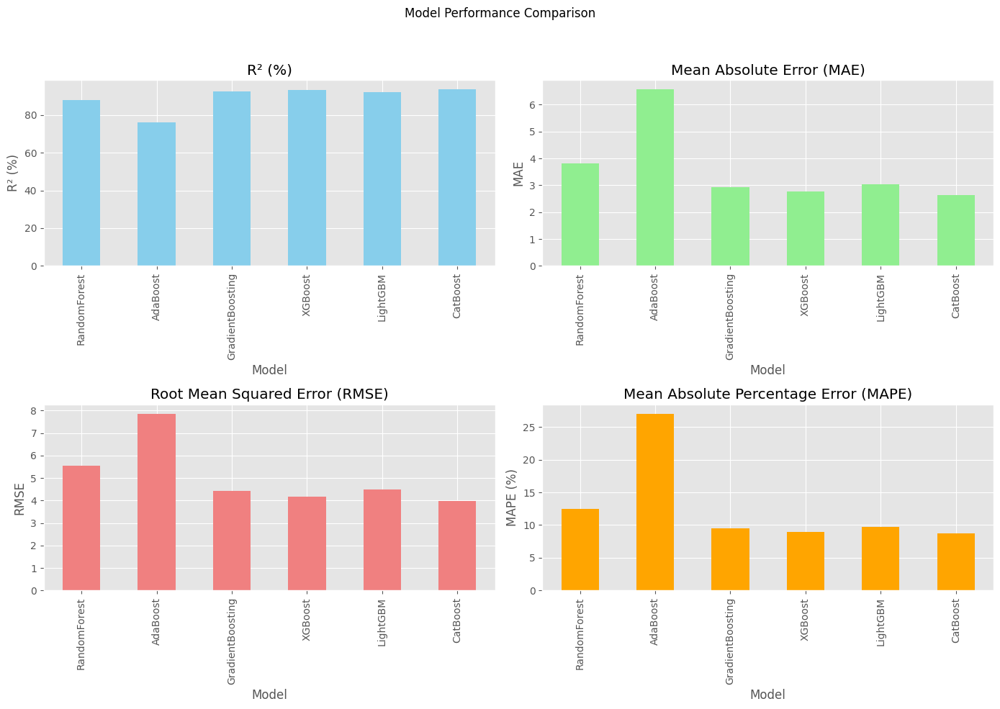

In [31]:
# Create a dictionary with model names and their metrics
metrics_data = {
    'Model': ['RandomForest', 'AdaBoost', 'GradientBoosting', 'XGBoost', 'LightGBM', 'CatBoost'],
    'R² (%)': [r2_rf, r2_ab, r2_gb, r2_xgb, r2_lgb, r2_catboost],
    'MAE': [mae_rf, mae_ab, mae_gb, mae_xgb, mae_lgb, mae_catboost],
    'RMSE': [rmse_rf, rmse_ab, rmse_gb, rmse_xgb, rmse_lgb, rmse_catboost],
    'MAPE (%)': [mape_rf, mape_ab, mape_gb, mape_xgb, mape_lgb, mape_catboost]
}

# Create a DataFrame from the dictionary
df_metrics = pd.DataFrame(metrics_data)

# Display the DataFrame
print(df_metrics)

# Plot a grouped bar chart to compare the metrics across models
df_metrics.set_index('Model', inplace=True)

# Plot the bar chart for each metric
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Model Performance Comparison')

# R² plot
df_metrics['R² (%)'].plot(kind='bar', ax=axes[0, 0], color='skyblue')
axes[0, 0].set_title('R² (%)')
axes[0, 0].set_ylabel('R² (%)')
axes[0, 0].set_xlabel('Model')

# MAE plot
df_metrics['MAE'].plot(kind='bar', ax=axes[0, 1], color='lightgreen')
axes[0, 1].set_title('Mean Absolute Error (MAE)')
axes[0, 1].set_ylabel('MAE')
axes[0, 1].set_xlabel('Model')

# RMSE plot
df_metrics['RMSE'].plot(kind='bar', ax=axes[1, 0], color='lightcoral')
axes[1, 0].set_title('Root Mean Squared Error (RMSE)')
axes[1, 0].set_ylabel('RMSE')
axes[1, 0].set_xlabel('Model')

# MAPE plot
df_metrics['MAPE (%)'].plot(kind='bar', ax=axes[1, 1], color='orange')
axes[1, 1].set_title('Mean Absolute Percentage Error (MAPE)')
axes[1, 1].set_ylabel('MAPE (%)')
axes[1, 1].set_xlabel('Model')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Best Performing Model

In [32]:
# Identifying the model with the highest R² and lowest MAE, RMSE, MAPE
best_model = df_metrics.idxmax()['R² (%)']  # Prioritize R² for performance
print(f"The model with the best R² is: {best_model}")

# The result of the best model for verification
best_metrics = df_metrics.loc[best_model]
print(f"Best model metrics:\n{best_metrics}")

The model with the best R² is: CatBoost
Best model metrics:
R² (%)      93.867291
MAE          2.642597
RMSE         3.975245
MAPE (%)     8.778278
Name: CatBoost, dtype: float64


Saving the Model

In [ ]:
with open('best_catboost_model.pkl', 'wb') as model_file:
    pickle.dump(best_catboost, model_file)
print("Model saved successfully!")

Optimization

In [2]:
with open('best_catboost_model.pkl', 'rb') as model_file:
    loaded_catboost_model = pickle.load(model_file)
print("Model loaded successfully!")

Model loaded successfully!


In [33]:
best_catboost = loaded_catboost_model

# Unit costs and carbon footprints for materials (as defined)
unit_costs = {
    'cement': 0.1, 'slag': 0.05, 'flyash': 0.03, 'water': 0.001,
    'superplasticizer': 0.2, 'coarseaggregate': 0.01, 'fineaggregate': 0.02
}
carbon_footprints = {
    'cement': 0.9, 'slag': 0.05, 'flyash': 0.02, 'water': 0.001,
    'superplasticizer': 0.1, 'coarseaggregate': 0.01, 'fineaggregate': 0.015
}
# Densities of materials in kg/m^3
densities = {
    'cement': 3150, 'slag': 2900, 'flyash': 2200,
    'coarseaggregate': 2650, 'fineaggregate': 2650, 'water': 1000
}

# Define constraints
target_compressive_strength = 40  # MPa (modify this if needed)
max_water_cement_ratio = 0.5
min_aggregate_ratio = 2.5
volume_constraint = 1.0  # Volume in m³ (1 cubic meter)
volume_tolerance = 0.02  # 2% tolerance
strength_tolerance = 0.05  # 5% tolerance
max_carbon_footprint = 200  # Maximum allowed carbon footprint in kg CO2-eq

# Function to compute total volume considering material densities
def calculate_volume(cement, slag, flyash, water, coarseaggregate, fineaggregate):
    volume_cement = cement / densities['cement']
    volume_slag = slag / densities['slag']
    volume_flyash = flyash / densities['flyash']
    volume_water = water / densities['water']
    volume_coarseaggregate = coarseaggregate / densities['coarseaggregate']
    volume_fineaggregate = fineaggregate / densities['fineaggregate']
    return volume_cement + volume_slag + volume_flyash + volume_water + volume_coarseaggregate + volume_fineaggregate

# Optimization objective
def objective(trial):
    # Suggest mix proportions within a reasonable range
    cement = trial.suggest_uniform('cement', 100, 500)  
    slag = trial.suggest_uniform('slag', 50, 300)      
    flyash = trial.suggest_uniform('flyash', 0, 200)   
    water = trial.suggest_uniform('water', 140, 210)   
    superplasticizer = trial.suggest_uniform('superplasticizer', 0, 10)  
    coarseaggregate = trial.suggest_uniform('coarseaggregate', 800, 1600)  
    fineaggregate = trial.suggest_uniform('fineaggregate', 600, 1200)      
    age = trial.suggest_uniform('age', 1, 365)  # Concrete age in days

    # Calculate total binder and aggregate
    total_binder = cement + slag + flyash
    total_aggregate = coarseaggregate + fineaggregate

    # Calculate water-to-binder ratio
    water_to_binder_ratio = water / total_binder
    wc_ratio = water / cement
    
    # Calculate total volume
    total_volume = calculate_volume(cement, slag, flyash, water, coarseaggregate, fineaggregate)
    
    # Predict compressive strength using the pre-trained CatBoost model
    mix = np.array([[cement, slag, flyash, water, superplasticizer, coarseaggregate, fineaggregate, age]])
    predicted_compressive_strength = best_catboost.predict(mix)[0]

    # Calculate total cost and carbon footprint
    total_cost = (cement * unit_costs['cement'] + slag * unit_costs['slag'] +
                  flyash * unit_costs['flyash'] + water * unit_costs['water'] +
                  superplasticizer * unit_costs['superplasticizer'] +
                  coarseaggregate * unit_costs['coarseaggregate'] +
                  fineaggregate * unit_costs['fineaggregate'])

    total_carbon_footprint = (cement * carbon_footprints['cement'] + slag * carbon_footprints['slag'] +
                              flyash * carbon_footprints['flyash'] + water * carbon_footprints['water'] +
                              superplasticizer * carbon_footprints['superplasticizer'] +
                              coarseaggregate * carbon_footprints['coarseaggregate'] +
                              fineaggregate * carbon_footprints['fineaggregate'])

    # Apply penalties for violating constraints
    penalty = 0
    if wc_ratio > max_water_cement_ratio:
        penalty += 1e6 * (wc_ratio - max_water_cement_ratio)  # Penalize if W/C ratio > max limit
    
    aggregate_ratio = total_aggregate / total_binder
    if aggregate_ratio < min_aggregate_ratio:
        penalty += 1e6 * (min_aggregate_ratio - aggregate_ratio)  # Penalize if aggregate ratio < min limit
    
    if not np.isclose(total_volume, volume_constraint, rtol=volume_tolerance):
        penalty += 1e6 * abs(total_volume - volume_constraint)  # Penalize if volume is not within 2% of 1m³

    if total_carbon_footprint > max_carbon_footprint:
        penalty += 1e6 * (total_carbon_footprint - max_carbon_footprint)  # Penalize if carbon footprint exceeds the limit

    # Constraint for predicted strength: it must be within ±5% of the target
    lower_bound = target_compressive_strength * (1 - strength_tolerance)
    upper_bound = target_compressive_strength * (1 + strength_tolerance)

    if not (lower_bound <= predicted_compressive_strength <= upper_bound):
        penalty += 1e6 * abs(predicted_compressive_strength - target_compressive_strength)  # Penalize if strength is outside ±5%

    # Objective: Minimize total cost, carbon footprint, and penalties
    return total_cost + total_carbon_footprint + penalty

# Run Optuna optimization
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Extract the best trial
best_trial = study.best_trial
best_params = best_trial.params

# Predicted strength and cost for the best trial
cement = best_params['cement']
slag = best_params['slag']
flyash = best_params['flyash']
water = best_params['water']
superplasticizer = best_params['superplasticizer']
coarseaggregate = best_params['coarseaggregate']
fineaggregate = best_params['fineaggregate']
age = best_params['age']

# Calculate predicted compressive strength for the best trial
mix = np.array([[cement, slag, flyash, water, superplasticizer, coarseaggregate, fineaggregate, age]])
predicted_strength = best_catboost.predict(mix)[0]

# Calculate total cost and carbon footprint for the best trial
total_cost = (cement * unit_costs['cement'] + slag * unit_costs['slag'] +
              flyash * unit_costs['flyash'] + water * unit_costs['water'] +
              superplasticizer * unit_costs['superplasticizer'] +
              coarseaggregate * unit_costs['coarseaggregate'] +
              fineaggregate * unit_costs['fineaggregate'])

total_carbon_footprint = (cement * carbon_footprints['cement'] + slag * carbon_footprints['slag'] +
                          flyash * carbon_footprints['flyash'] + water * carbon_footprints['water'] +
                          superplasticizer * carbon_footprints['superplasticizer'] +
                          coarseaggregate * carbon_footprints['coarseaggregate'] +
                          fineaggregate * carbon_footprints['fineaggregate'])

# Recalculate the strength bounds for the result
lower_bound = target_compressive_strength * (1 - strength_tolerance)
upper_bound = target_compressive_strength * (1 + strength_tolerance)

# Prediction accuracy: compare predicted strength to target strength
accuracy = 100 - ((np.abs(predicted_strength - target_compressive_strength) / target_compressive_strength) * 100)

# Print the results
print(f"Best Mix Proportions: {best_params}")
print(f"Total Volume: {total_volume:.3f} m³")
print(f"Total Cost: ${total_cost:.2f}")
print(f"Total Carbon Footprint: {total_carbon_footprint:.2f} kg CO2-eq")
print(f"Predicted Compressive Strength: {predicted_strength:.2f} MPa")
print(f"Prediction Accuracy: {accuracy:.2f}%")

# Check if the strength is within the 5% tolerance
if lower_bound <= predicted_strength <= upper_bound:
    print("The predicted compressive strength is within the ±5% tolerance.")
else:
    print("The predicted compressive strength is outside the ±5% tolerance.")


[I 2024-09-12 16:00:58,845] A new study created in memory with name: no-name-e445c931-76c4-40e8-aa52-844ee7eb448b
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2164356734.py:40: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  cement = trial.suggest_uniform('cement', 100, 500)
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2164356734.py:41: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  slag = trial.suggest_uniform('slag', 50, 300)
C:\Users\Temitope\AppData\Local\Temp\ipykernel_14168\2164356734.py:42: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  flyash = 

Best Mix Proportions: {'cement': 151.69593106380498, 'slag': 145.9847855978002, 'flyash': 177.52513708528588, 'water': 174.57217493917383, 'superplasticizer': 7.561176818852328, 'coarseaggregate': 1547.9096681736096, 'fineaggregate': 876.4435603307995, 'age': 248.8070262969831}
Total Volume: 1.080 m³
Total Cost: $62.49
Total Carbon Footprint: 176.93 kg CO2-eq
Predicted Compressive Strength: 41.97 MPa
Prediction Accuracy: 95.07%
The predicted compressive strength is within the ±5% tolerance.


To Perform Sensitivity Analysis for Different Concrete Grades

In [4]:
# List of target compressive strengths to evaluate
target_strengths = [20, 30, 40, 50, 60, 70, 80]

# Initialize an empty list to store results
results = []

# Function to run the optimization and collect results
def run_optimization(target_compressive_strength, n_trials=100):
    global study
    
    # Repeat the optimization process 10 times for each target compressive strength
    predicted_strengths = []
    total_costs = []
    total_carbon_footprints = []
    accuracies = []

    for _ in range(10):
        study = optuna.create_study(direction='minimize')
        study.optimize(objective, n_trials=n_trials)

        # Extract the best trial
        best_trial = study.best_trial
        best_params = best_trial.params

        # Calculate predicted compressive strength for the best trial
        cement = best_params['cement']
        slag = best_params['slag']
        flyash = best_params['flyash']
        water = best_params['water']
        superplasticizer = best_params['superplasticizer']
        coarseaggregate = best_params['coarseaggregate']
        fineaggregate = best_params['fineaggregate']
        age = best_params['age']

        mix = np.array([[cement, slag, flyash, water, superplasticizer, coarseaggregate, fineaggregate, age]])
        predicted_strength = best_catboost.predict(mix)[0]
        predicted_strengths.append(predicted_strength)

        # Calculate total cost and carbon footprint for the best trial
        total_cost = (cement * unit_costs['cement'] + slag * unit_costs['slag'] +
                      flyash * unit_costs['flyash'] + water * unit_costs['water'] +
                      superplasticizer * unit_costs['superplasticizer'] +
                      coarseaggregate * unit_costs['coarseaggregate'] +
                      fineaggregate * unit_costs['fineaggregate'])
        total_costs.append(total_cost)

        total_carbon_footprint = (cement * carbon_footprints['cement'] + slag * carbon_footprints['slag'] +
                                  flyash * carbon_footprints['flyash'] + water * carbon_footprints['water'] +
                                  superplasticizer * carbon_footprints['superplasticizer'] +
                                  coarseaggregate * carbon_footprints['coarseaggregate'] +
                                  fineaggregate * carbon_footprints['fineaggregate'])
        total_carbon_footprints.append(total_carbon_footprint)

        # Recalculate the strength bounds for the result
        lower_bound = target_compressive_strength * (1 - strength_tolerance)
        upper_bound = target_compressive_strength * (1 + strength_tolerance)

        # Prediction accuracy: compare predicted strength to target strength
        accuracy = 100 - ((np.abs(predicted_strength - target_compressive_strength) / target_compressive_strength) * 100)
        accuracies.append(accuracy)

    # Calculate averages over 10 runs
    avg_predicted_strength = np.mean(predicted_strengths)
    avg_total_cost = np.mean(total_costs)
    avg_total_carbon_footprint = np.mean(total_carbon_footprints)
    avg_accuracy = np.mean(accuracies)

    # Store results for this target strength
    results.append({
        'Target Strength (MPa)': target_compressive_strength,
        'Avg Predicted Strength (MPa)': avg_predicted_strength,
        'Avg Total Cost ($)': avg_total_cost,
        'Avg Carbon Footprint (kg CO2-eq)': avg_total_carbon_footprint,
        'Avg Accuracy (%)': avg_accuracy
    })

# Run the optimization for each target strength
for target_compressive_strength in target_strengths:
    run_optimization(target_compressive_strength)

# Convert results to a DataFrame
df_results = pd.DataFrame(results)

# Print the DataFrame
df_results

# Save the DataFrame to a CSV file
# df_results.to_csv('optimization_results.csv', index=False)
